<h1> D7041E Lab4</h1>
Sune Larsson, sunlar-3@student.ltu.se

Elliot Eriksson, lelrek-1@student.ltu.se

In [ ]:
import numpy as np
import numpy.matlib
from matplotlib import pyplot as plt
import math
import time
from keras.datasets import mnist

### Flatten the image (1D array), array of pixels of each image as a feature 

In [ ]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [ ]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [ ]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [ ]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [ ]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [ ]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = dispRes[0]
    ncols = dispRes[1]
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training with",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([]) 
        plt.show()
        plt.close()
    
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    	
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;
        if showMode >= 1 and t == nepochs // 2:
            print("\nSOM features after 50% with",ndim ," dim: \n")
        
            fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
            for k in range(nrows):
                for l in range (ncols):
                    A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                    ax[k,l].imshow(A,cmap="plasma")
                    ax[k,l].set_yticks([])
                    ax[k,l].set_xticks([])
            plt.show()
            plt.close()

    if showMode >= 1:
        print("\nSOM features AFTER training",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
            ax[k,l].set_xticks([])   
        plt.show()
        plt.close()
    return som
    

In [ ]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        0: input_data[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].to_numpy()
    }

    return input_database, labels, classes

In [ ]:
input_filename = 'data/zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename, None)


In [ ]:
#verification of correctness on the training set:

def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    




SOM features before training with 20  dim: 



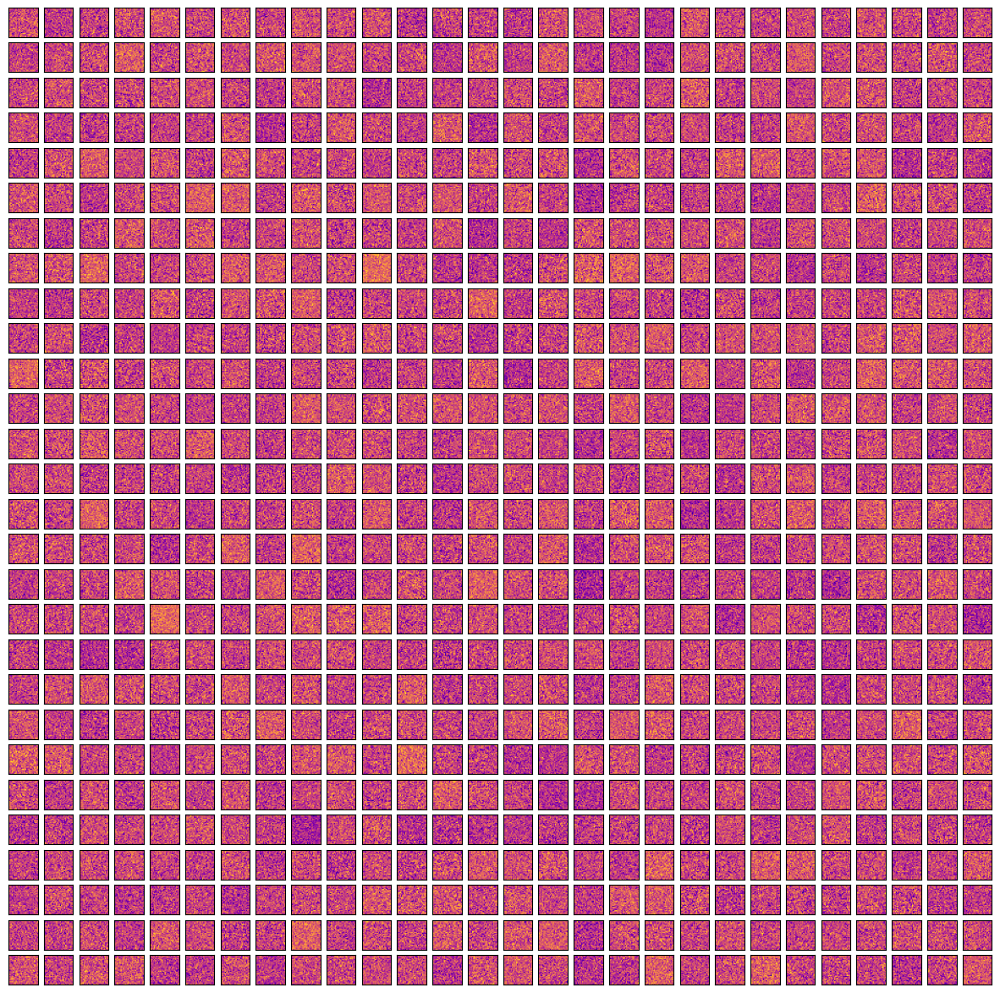


SOM features after 50% with 20  dim: 



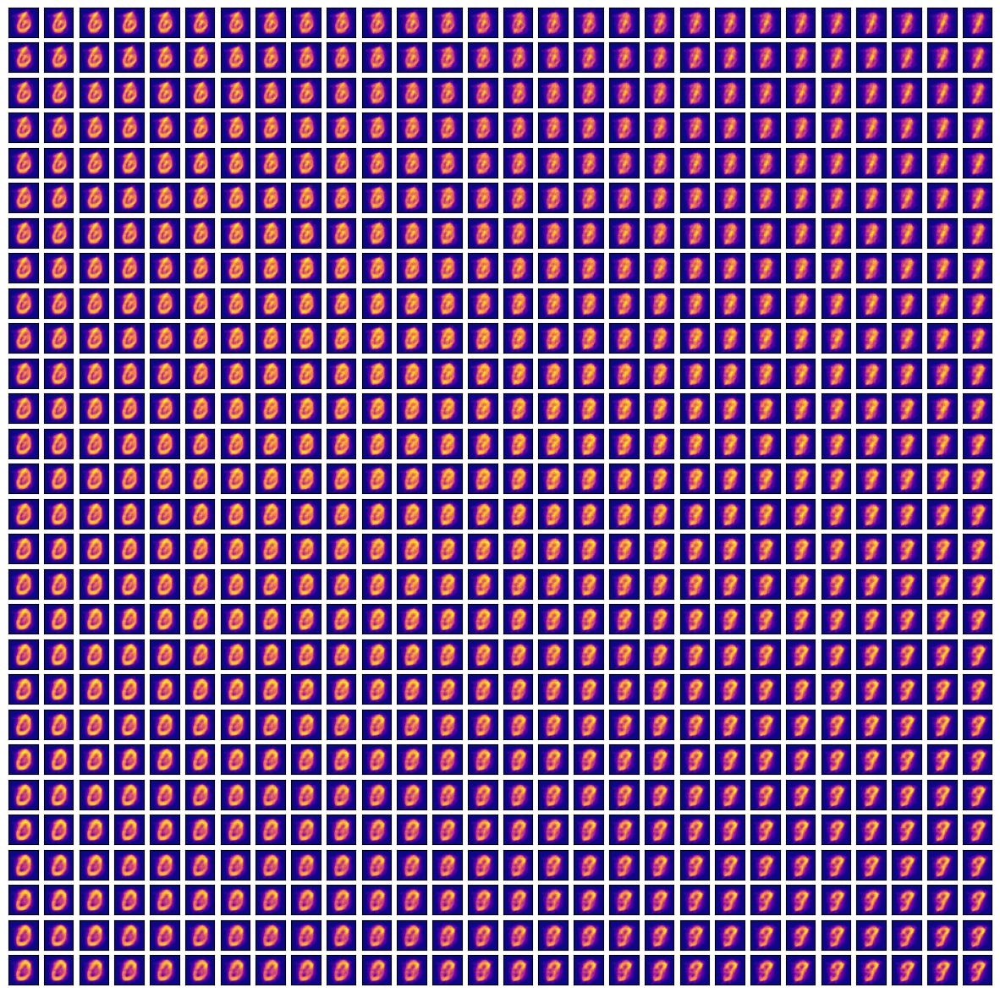


SOM features AFTER training 20  dim: 



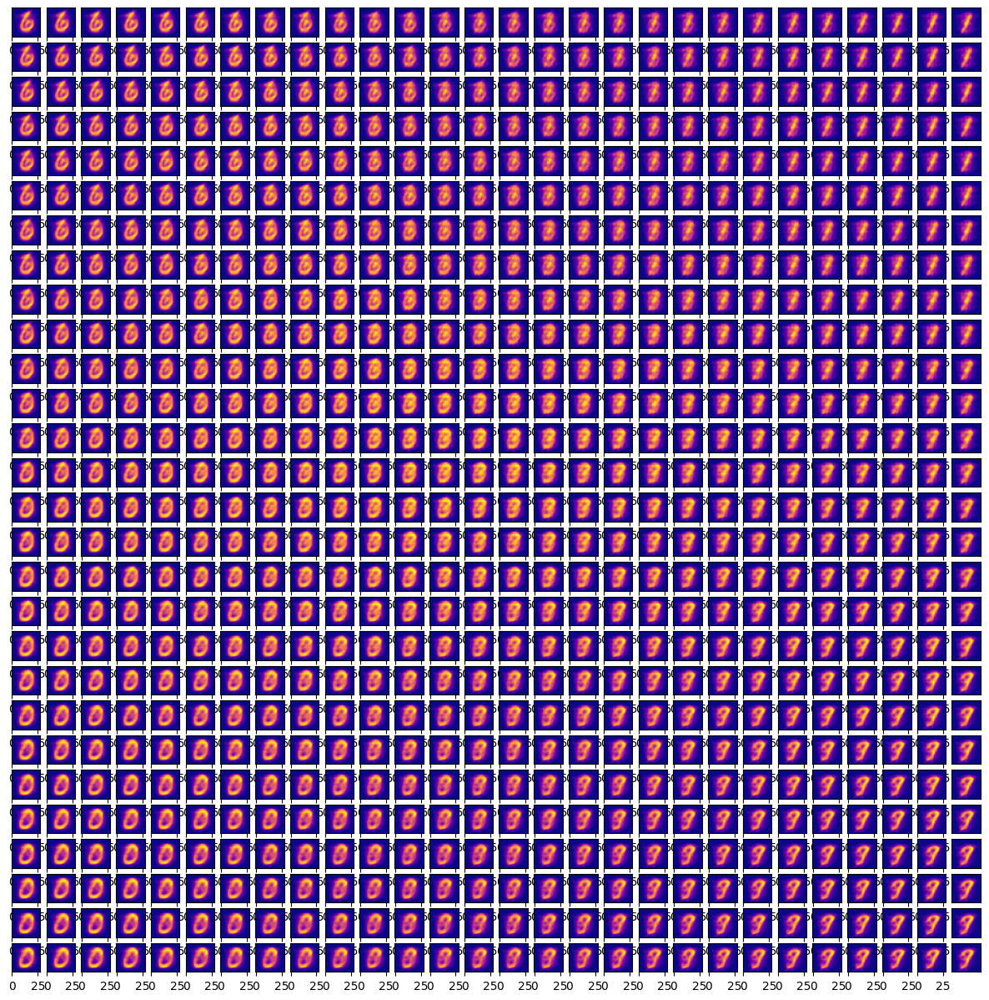


SOM features before training with 40  dim: 



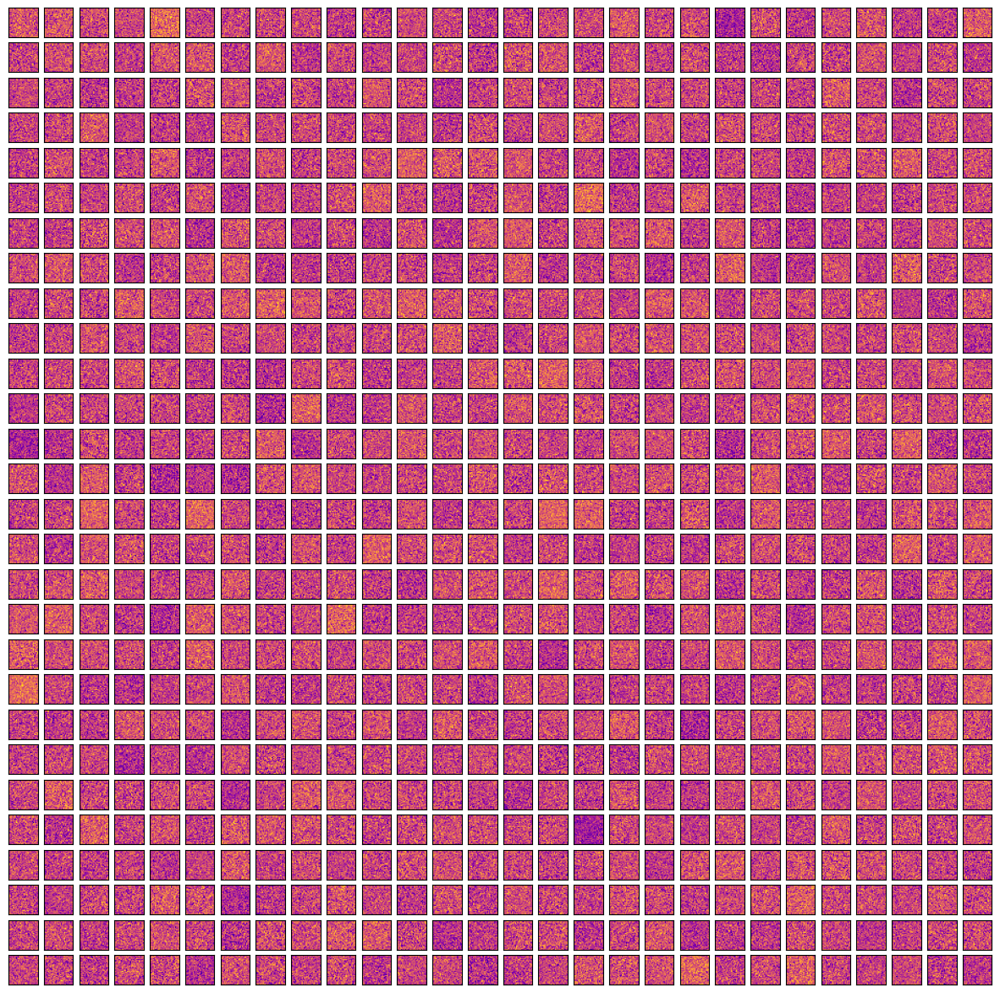


SOM features after 50% with 40  dim: 



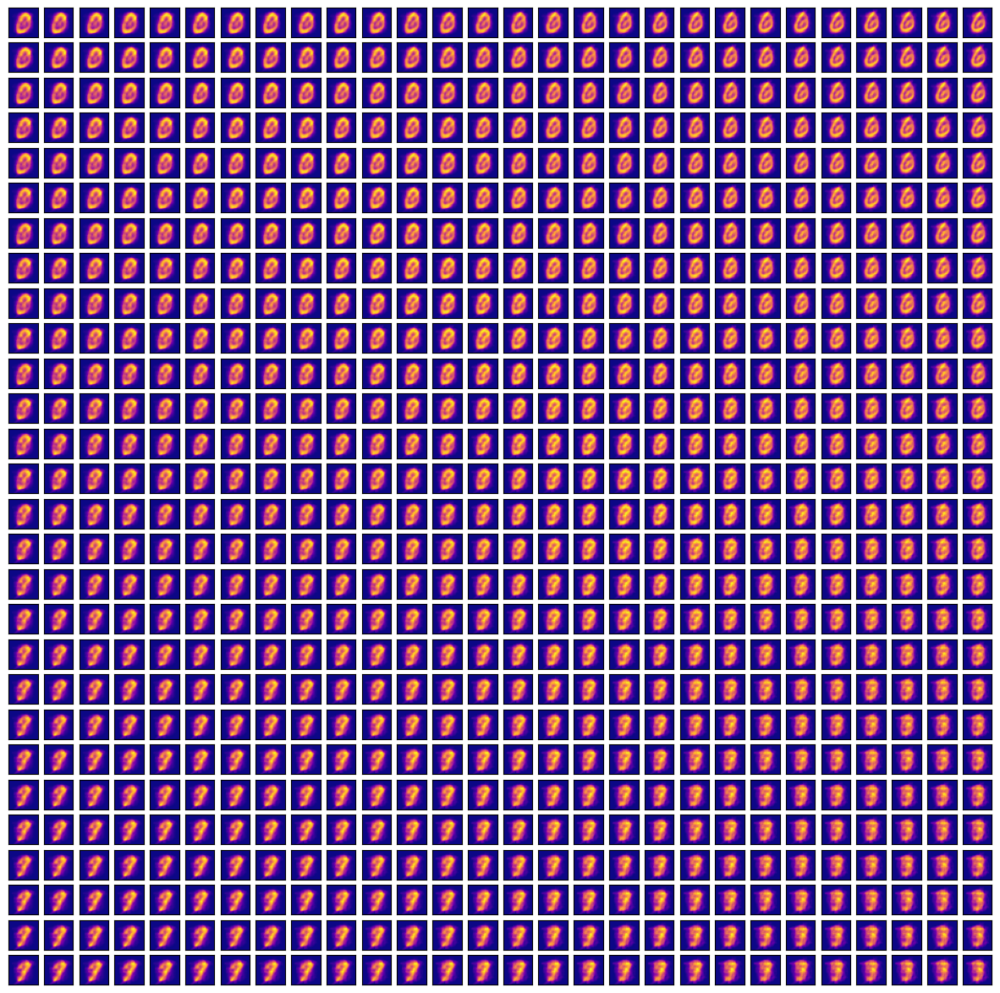


SOM features AFTER training 40  dim: 



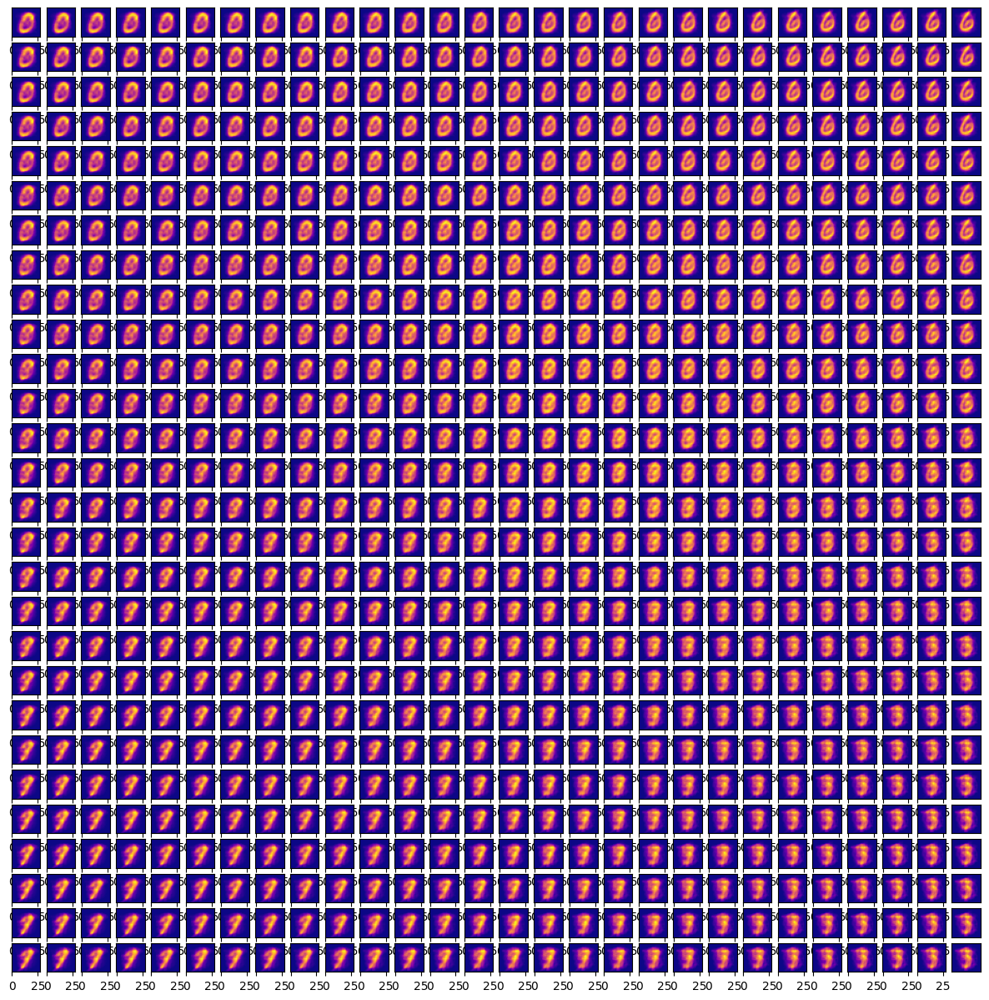


SOM features before training with 80  dim: 



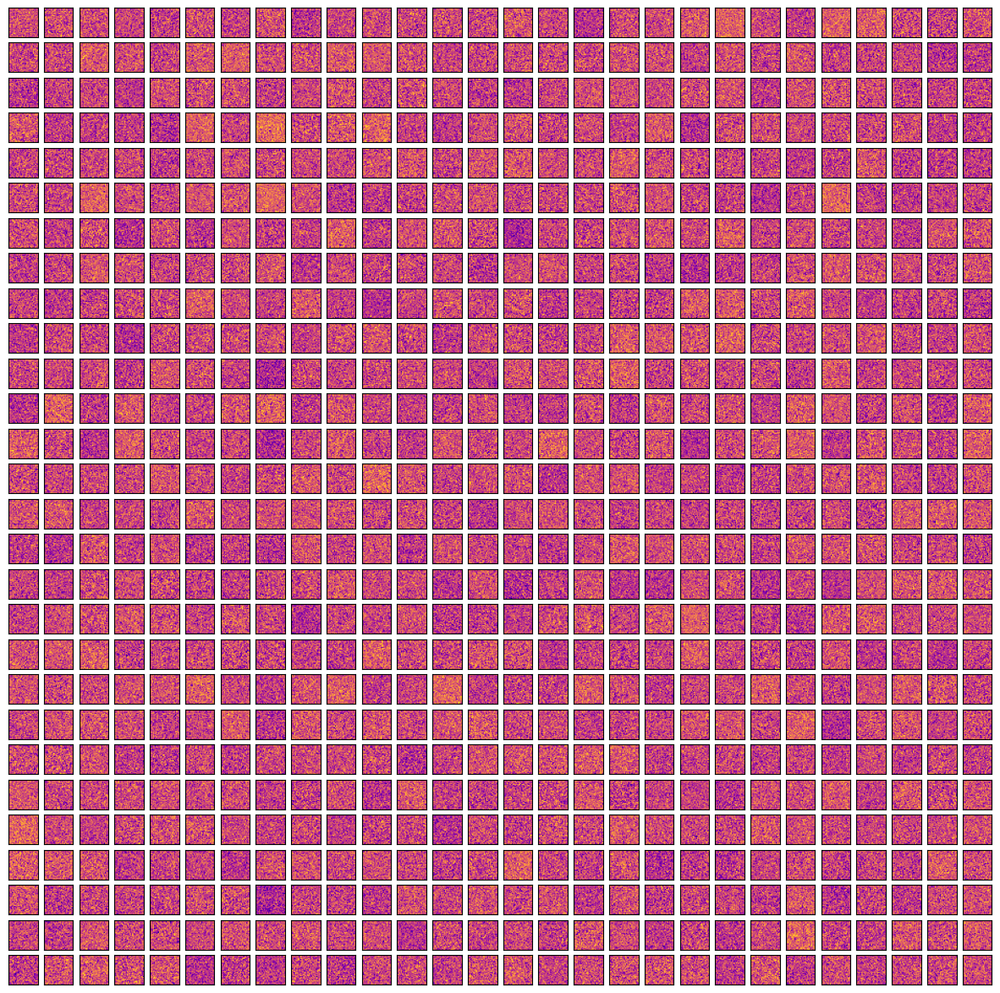


SOM features after 50% with 80  dim: 



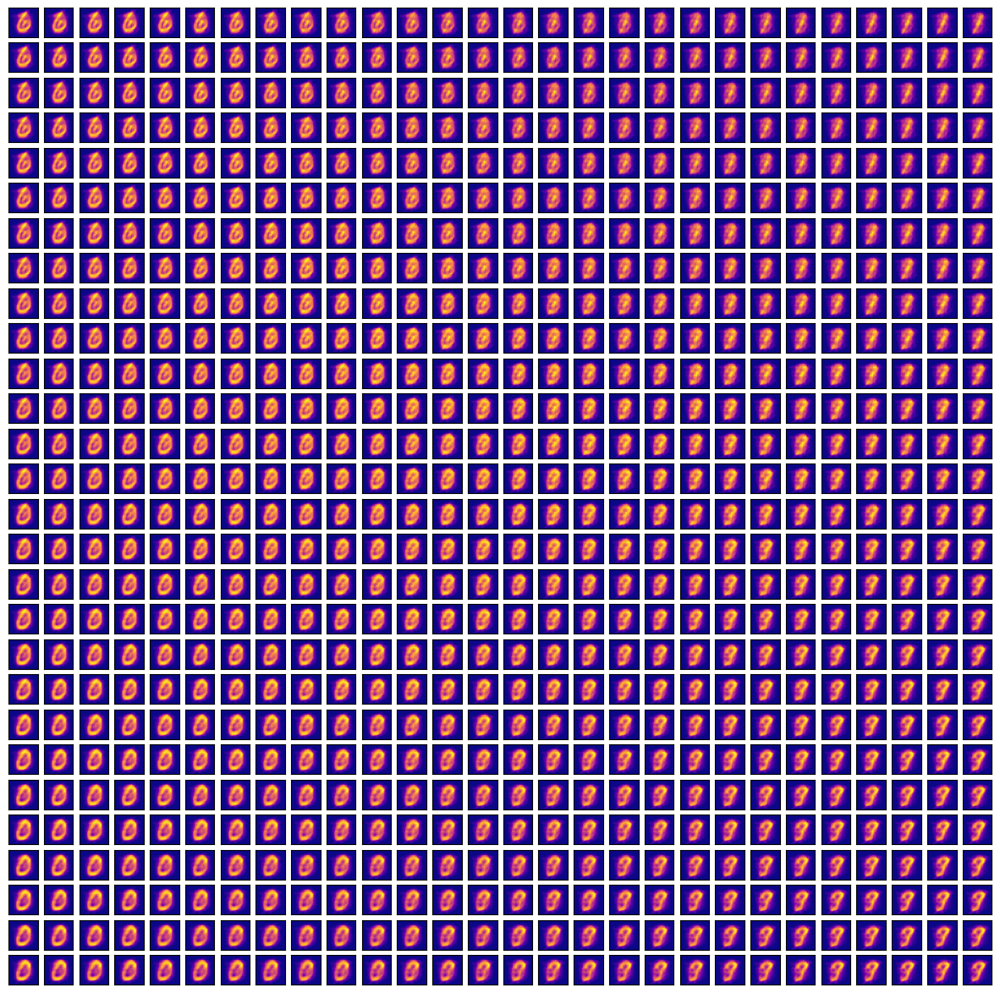


SOM features AFTER training 80  dim: 



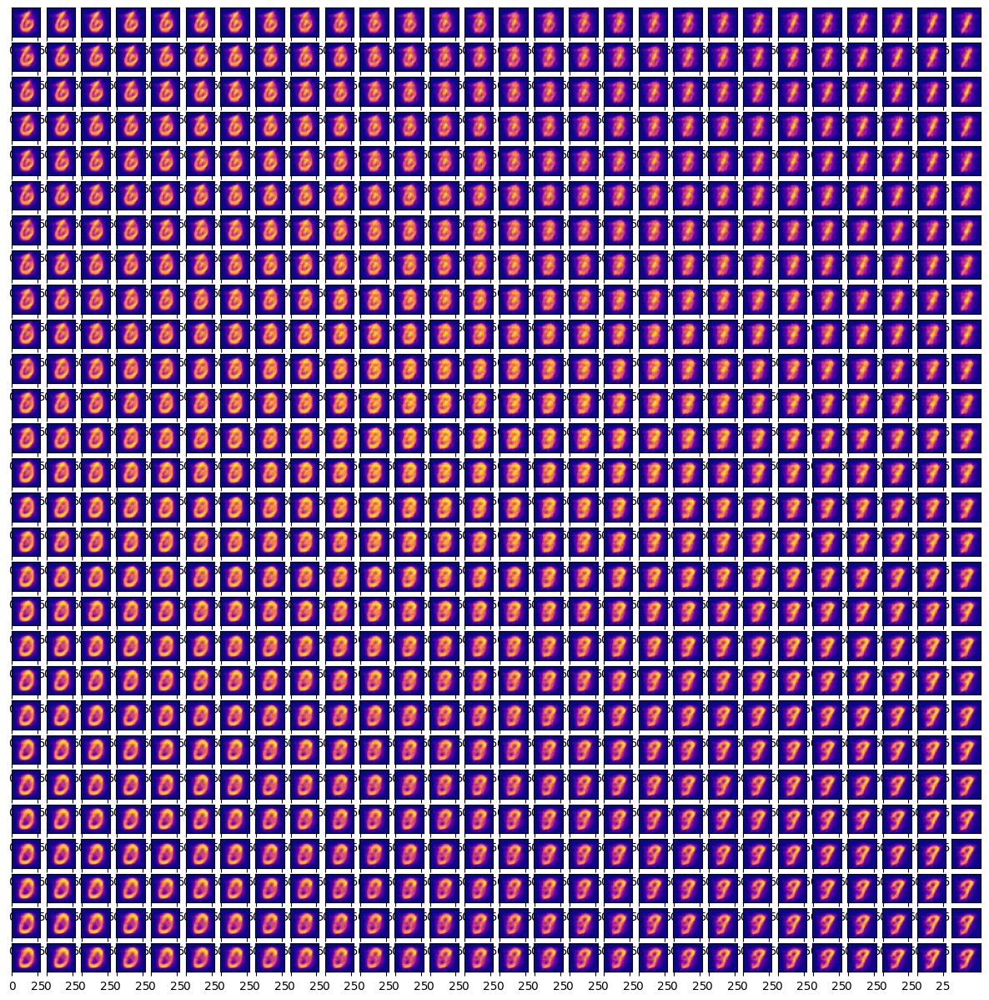

In [36]:
(Xtr, Ltr), (X_test, L_test) = mnist.load_data()
sample_size = 100

Xtr = Xtr[:sample_size]
Ltr = Ltr[:sample_size]
X_test = X_test[:sample_size]
L_test = L_test[:sample_size]

# Flatten and normalize
Xtr_flatten = Xtr.reshape(Xtr.shape[0], -1) / 255.0
X_test_flatten = X_test.reshape(X_test.shape[0], -1) / 255.0


ndims = [20, 40, 80]
trained_soms = {}

for ndim in ndims:
    som_trained = SOM([28, 28], Xtr_flatten, ndim=ndim, nepochs=10, showMode=1)
    trained_soms[f"{ndim}x{ndim}"] = som_trained



In [39]:
def getAccuracy(confusion_matrix):
    return np.trace(confusion_matrix) / np.sum(confusion_matrix)

In [34]:

def getConfusionMatrix(train_data, SOM, ndim, npochs=10, eta0=0.1, etadecay=0.05):
    nrows=ndim
    ncols=ndim
    grid_color=np.zeros((nrows,ncols))
    nclasses=np.max(classes)

    confusion_matrix=np.zeros((nclasses,nclasses))
    grid_color,confusion_matrix=SOM_Test (train_data, SOM, classes, grid_color, confusion_matrix, ndim)


    return confusion_matrix, Xtr_flatten.shape, np.sum(confusion_matrix) ,grid_color


20x20 Training Accuracy: 0.67
20x20 Testing Accuracy: 0.77
40x40 Training Accuracy: 0.61
40x40 Testing Accuracy: 0.75
80x80 Training Accuracy: 0.67
80x80 Testing Accuracy: 0.78


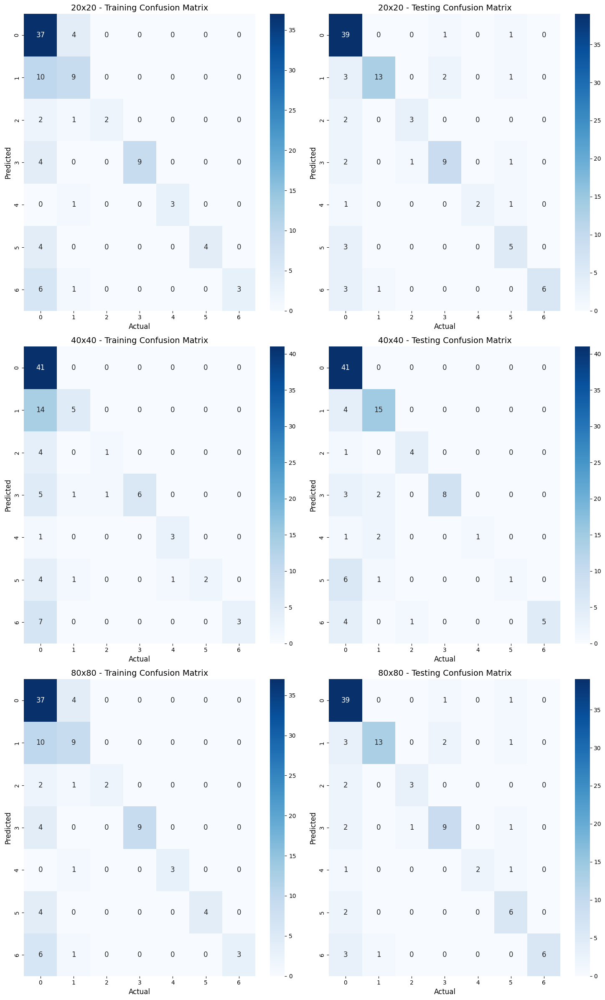

In [47]:
import seaborn as sns
number_of_dimensions = [20, 40, 80]

fig, axes = plt.subplots(len(number_of_dimensions), 2, figsize=(15, len(number_of_dimensions) * 8))

for i, ndim in enumerate(number_of_dimensions):
    confusion_matrix,  Xtr_flatten_shape, sum_confusion_matrix, grid_color = getConfusionMatrix(Xtr_flatten, trained_soms[f"{ndim}x{ndim}"], 28)
    sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 0], cmap="Blues")
    axes[i, 0].set_title(f"{ndim}x{ndim} - Training Confusion Matrix", fontsize=14)
    axes[i, 0].set_ylabel("Predicted", fontsize=12)
    axes[i, 0].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Training Accuracy: {np.trace(confusion_matrix) / np.sum(confusion_matrix)}")
    # print(f"Confusion matrix for {ndim}x{ndim} SOM:", confusion_matrix)
    calculated_accuracy = getAccuracy(confusion_matrix)

    confusion_matrix,  Xtr_flatten_shape, sum_confusion_matrix, grid_color = getConfusionMatrix(X_test_flatten, trained_soms[f"{ndim}x{ndim}"], 28)
    sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 1], cmap="Blues")
    axes[i, 1].set_title(f"{ndim}x{ndim} - Testing Confusion Matrix", fontsize=14)
    axes[i, 1].set_ylabel("Predicted", fontsize=12)
    axes[i, 1].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Testing Accuracy: {np.trace(confusion_matrix) / np.sum(confusion_matrix)}")
    # print(f"Confusion matrix for {ndim}x{ndim} SOM:", confusion_matrix)
    calculated_accuracy = getAccuracy(confusion_matrix)
plt.tight_layout()
plt.show()


## Initializing the weights in the SOM network randomly
- Train SOM with grid `20 x 20`,`40 x 40`, `80 x 80`

6. For a fixed number of iterations increase and decrease the learning rate of
SOM:
o What is the resulting effect?


The data shows that as the learning rate increases, the accuracy generally improves, peaking at learning rates around 0.9526  with an accuracy of 0.7. The optimal learning rate appears to be in the range of 0.81 to 1.0 where the accuracy is between 67-70%.

In [51]:

start_lr = 0.1  
end_lr = 1.0    
num_values = 20 
learning_rates = np.linspace(start_lr, end_lr, num_values)

best_learning_rate = 0
best_accuracy = 0
runs = 5
for lr in learning_rates:
    print(f"Learning Rate: {lr}")
    accuracy = 0
    for run in range(runs):
        som_trained = SOM([28, 28], Xtr_flatten, ndim=20, eta0=lr)
        confusion_matrix, shape, sum_matrix, _ = getConfusionMatrix(Xtr_flatten, som_trained, ndim=28)
        accuracy += np.trace(confusion_matrix) / sum_matrix / runs
    print(f"Accuracy: {accuracy}")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_learning_rate = lr

print(f"Best Learning Rate: {best_learning_rate}")
print(f"Best Accuracy: {best_accuracy}")

Learning Rate: 0.1
Accuracy: 0.652
Learning Rate: 0.1473684210526316
Accuracy: 0.664
Learning Rate: 0.19473684210526315
Accuracy: 0.66
Learning Rate: 0.24210526315789474
Accuracy: 0.66
Learning Rate: 0.2894736842105263
Accuracy: 0.67
Learning Rate: 0.33684210526315794
Accuracy: 0.66
Learning Rate: 0.38421052631578945
Accuracy: 0.69
Learning Rate: 0.43157894736842106
Accuracy: 0.71
Learning Rate: 0.4789473684210527
Accuracy: 0.73
Learning Rate: 0.5263157894736842
Accuracy: 0.71
Learning Rate: 0.5736842105263158
Accuracy: 0.73
Learning Rate: 0.6210526315789474
Accuracy: 0.74
Learning Rate: 0.6684210526315789
Accuracy: 0.77
Learning Rate: 0.7157894736842105
Accuracy: 0.71
Learning Rate: 0.7631578947368421
Accuracy: 0.71
Learning Rate: 0.8105263157894737
Accuracy: 0.77
Learning Rate: 0.8578947368421053
Accuracy: 0.73
Learning Rate: 0.9052631578947369
Accuracy: 0.73
Learning Rate: 0.9526315789473684
Accuracy: 0.74
Learning Rate: 1.0
Accuracy: 0.8
Best Learning Rate: 1.0
Best Accuracy: 0.8


7. For a fixed number of iterations and the best learning rate increase and
decrease the exponential decay of the neighbourhood parameter.
8. What is the effect?
Testing to increase the decay rate from 0.01 to 0.6 gave an increasing accuracy untill the decay rate hit 0.33 where the accuracy stabilizes at approx 99% 

In [52]:
start_lr = 0.01  
end_lr = 0.6    
num_values = 25 
decay_values = np.linspace(start_lr, end_lr, num_values)

best_accuracy = 0
best_decay_value = 0

for decay_value in decay_values:
    print(f"Decay Rate: {decay_value}")
    accuracy = 0
    for run in range(5):
        som_trained = SOM([28, 28], Xtr_flatten, ndim=20, eta0=0.85, etadecay=0.05, sgm0=20, sgmdecay=decay_value, showMode=0)
        
        confusion_matrix, shape, sum_matrix,_ = getConfusionMatrix(Xtr_flatten, som_trained, ndim=28)
        accuracy += np.trace(confusion_matrix) / sum_matrix / 5
    print(f"Accuracy: {accuracy}")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_decay_value = decay_value

print(f"Best Decay Value: {best_decay_value}")
print(f"Best Accuracy: {best_accuracy}")

Decay Rate: 0.01
Accuracy: 0.66
Decay Rate: 0.034583333333333334
Accuracy: 0.67
Decay Rate: 0.059166666666666666
Accuracy: 0.7
Decay Rate: 0.08374999999999999
Accuracy: 0.782
Decay Rate: 0.10833333333333332
Accuracy: 0.802
Decay Rate: 0.13291666666666666
Accuracy: 0.8919999999999999
Decay Rate: 0.1575
Accuracy: 0.8839999999999999
Decay Rate: 0.18208333333333332
Accuracy: 0.9139999999999999
Decay Rate: 0.20666666666666667
Accuracy: 0.944
Decay Rate: 0.23125
Accuracy: 0.974
Decay Rate: 0.2558333333333333
Accuracy: 0.982
Decay Rate: 0.28041666666666665
Accuracy: 0.988
Decay Rate: 0.305
Accuracy: 0.99
Decay Rate: 0.32958333333333334
Accuracy: 0.996
Decay Rate: 0.35416666666666663
Accuracy: 0.992
Decay Rate: 0.37875
Accuracy: 0.998
Decay Rate: 0.4033333333333333
Accuracy: 0.994
Decay Rate: 0.42791666666666667
Accuracy: 1.0
Decay Rate: 0.4525
Accuracy: 1.0
Decay Rate: 0.4770833333333333
Accuracy: 0.996
Decay Rate: 0.5016666666666666
Accuracy: 0.998
Decay Rate: 0.52625
Accuracy: 0.992
Decay R

What is a biological neuron? 
Biological neurons are specialized cells in the nervous system responsible for transmitting electrical and chemical signals throughout the body. They are the part of the nervous tissue in all animals (with some exceptions) and play a critical role in processing and relaying information. Neurons communicate with each other through synapses, using electrical impulses and neurotransmitters to send signals across the neural network, enabling functions like sensation, movement, thought, and emotion.

How does it relate to the concept of neurons in SOM?
While neurons in SOMs are conceptually inspired by biological neurons, they take on a more abstract and mathematical role. In an SOM, a neuron represents a computational unit or node within a grid structure, where each neuron has a set of weights that define it. These neurons process input data and use learning algorithms to adjust their weights, enabling them to adapt and organize themselves based on the data patterns. This process is similar to how biological neurons change the strength of their connections in response to activity, allowing for learning and adaptation in a network.